# Comparing GradCAM's of Different Networks
In this notebook we demonstrate the class discriminative ability of different standard image classification networks that the torchvision library provides. 
We compare the following: 
- resnet50
- densenet121 
- googlenet 
- vgg19

In [1]:
from GradCam import GradCam

from torchvision import models as pretrained
from PIL import Image, ImageDraw

from typing import List, Union

import torch

from IPython.display import display
import numpy as np

/home2/aa_aanegola/miniconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
class ImageClassificationGCWrapper:

    def __init__(self, models:List[torch.nn.Module], layers:List[torch.nn.Module], device, images:List[Image.Image], model_names:Union[List[str],None] = None):

        self.device = device
        assert len(models) == len(layers), "Same number of models and layers of interest should be provided"

        if model_names is None:
            self.model_names = [f"Model {i}" for i in range(len(models))]
        else:
            assert len(model_names) == len(models), "Same number of models and model names should be provided"
            self.model_names = model_names

        self.gradcams = [GradCam(m, l, self.device) for (m,l) in zip(models, layers)]
        self.images = images

    def evaluate(self, save=False):

        for i,image in enumerate(self.images):
            print("Baseline Image")
            display(image)
            heatmaps = [gc(image) for gc in self.gradcams]

            for hm, model_name in zip(heatmaps, self.model_names):
                ImageDraw.Draw(hm).text((0, 0), model_name, (255, 255, 255))

            heatmaps = Image.fromarray(np.hstack([np.array(hm) for hm in heatmaps]))

            if save:
                heatmaps.save(f"Heatmap{i}.png", 'PNG')
            else:
                display(heatmaps)

In [3]:
models = [
        pretrained.resnet50(pretrained=True), 
        pretrained.densenet121(pretrained=True), 
        pretrained.googlenet(pretrained=True), 
        pretrained.vgg19(pretrained=True)
    ]


layers = [
        models[0].layer4,
        models[1].features.denseblock4, 
        models[2].inception5b, 
        models[3].features[35]
    ]


images = [
        Image.open("./sample_images/dog_and_cat.jpeg"), 
        Image.open("./sample_images/elephant.jpg"), 
        Image.open("./sample_images/penguin.jpeg"), 
        Image.open("./sample_images/tiger.jpeg")
    ]
    
model_names = [
        "ResNet50", 
        "DenseNet121", 
        "GoogleNet", 
        "VGG19"
    ]


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /home2/aa_aanegola/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:04<00:00, 23.2MB/s]
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /home2/aa_aanegola/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:03<00:00, 9.66MB/s]
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /home2/aa_aanegola/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:04<00:00, 12.0MB/s]


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [5]:
icgcw = ImageClassificationGCWrapper(models, layers, device, images, model_names)


Baseline Image


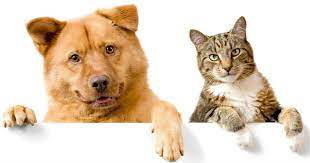

/home2/aa_aanegola/miniconda3/envs/torch/lib/python3.9/site-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


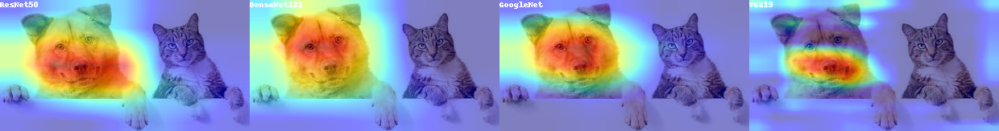

Baseline Image


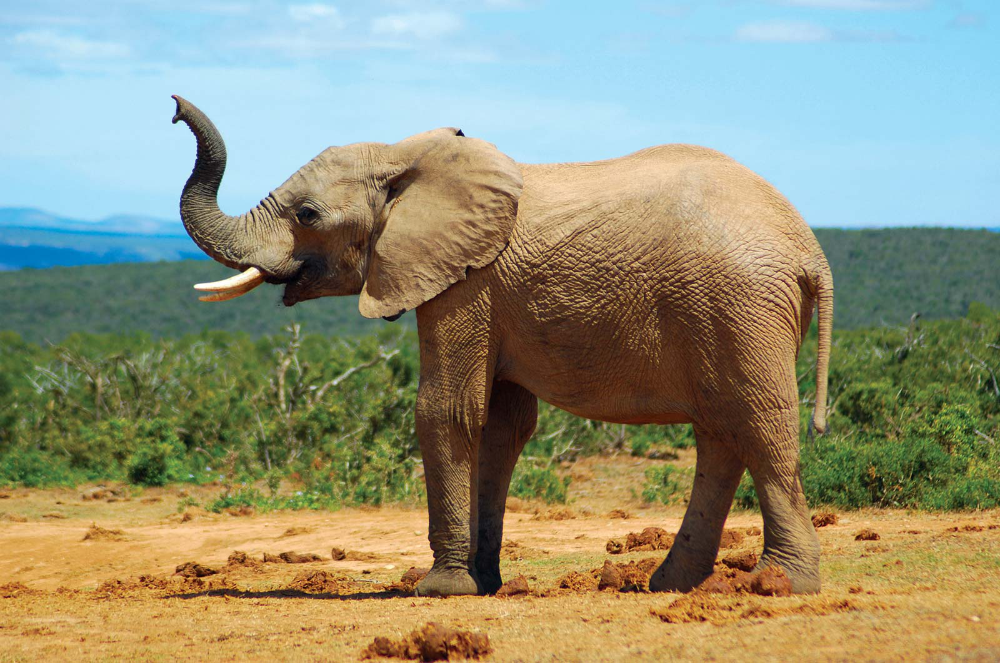

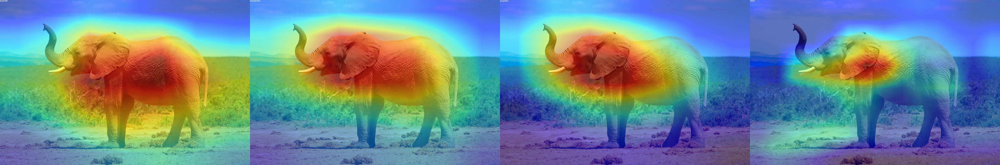

Baseline Image


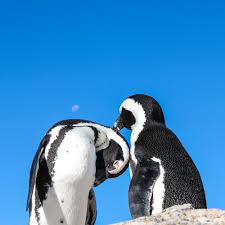

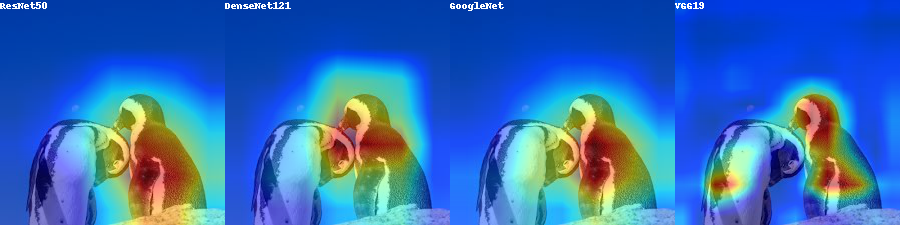

Baseline Image


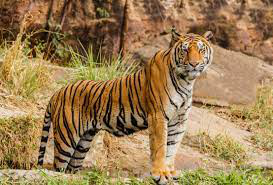

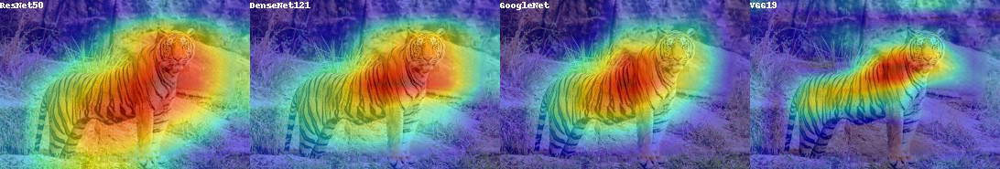

In [6]:
icgcw.evaluate()

As we can see, all the networks focus on regions of interest within the image that align with the desired output. ResNet, DenseNet and GoogleNet have a larger area of focus while VGG19 has a smaller, but noisier target. 